In [18]:
import numpy as np
import libpysal as ps
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW
import geopandas as gp
from pandas import DataFrame,Series
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import mapclassify.classifiers as classifiers
import matplotlib.patches as mpatches
import datetime
import pytz   
import math
from shapely.geometry import Point,Polygon 
from fiona.crs import from_epsg

In [2]:
data = pd.read_csv('data - GWR.csv')  
London_shp = gp.read_file(r'C:\Users\98001\PY Fire record\GWR_Final\map\LSOA_2011_London_gen_MHW.shp')  
London_bdy = gp.read_file(r'C:\Users\98001\PY Fire record\GWR_Final\map\London_administrative_boundary.shp')

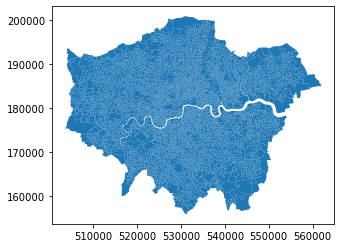

In [3]:
London_shp.plot()
plt.show() # check if the map file has load suddceefully

In [4]:
London_shp['LSOA_Code']=London_shp['LSOA11CD']
London_shp2=pd.merge(London_shp,data,on='LSOA_Code',how='left')
#London_shp2.head()

In [5]:
independent_variable=['Index of Multiple Deprivation (IMD) Score','Age_65+','Children_15-','Road_density','Street_network_density',
           'Household spaces with at least one usual resident','Traffic_light_density','Distance','FirstPumpArriving_AttendanceTime'
                     ,'Winter','Commute','Weekend',"Fire_Station_number"]

---
# Data Presentation
---

## The independent variables related to the socio-economic factors 

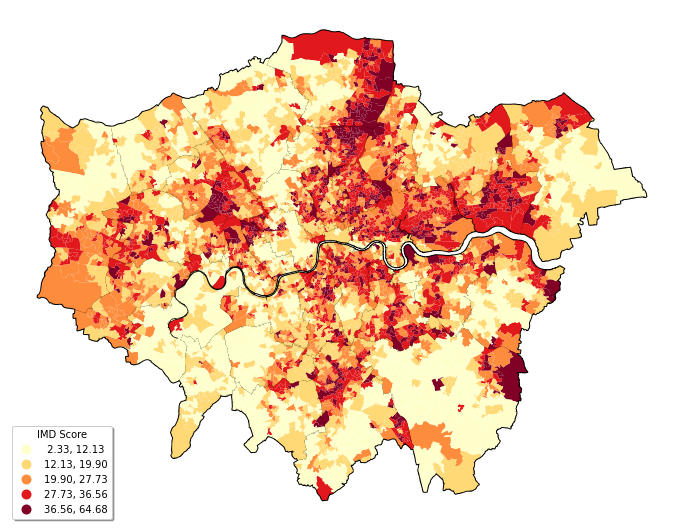

In [6]:
# Distribution map

fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,             
        facecolor='none',     
        edgecolor='Black',
        linewidth=2).axis('off')    
London_shp2.plot(ax=ax,             
        column=independent_variable[0],    
        scheme='naturalbreaks',    
        legend=True,  
        legend_kwds={"loc": "lower left",'title':'IMD Score','shadow': True},       
        cmap='YlOrRd',   
        edgecolor='none').axis('off')    
    
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/IMD_Socre.png', dpi=400) 

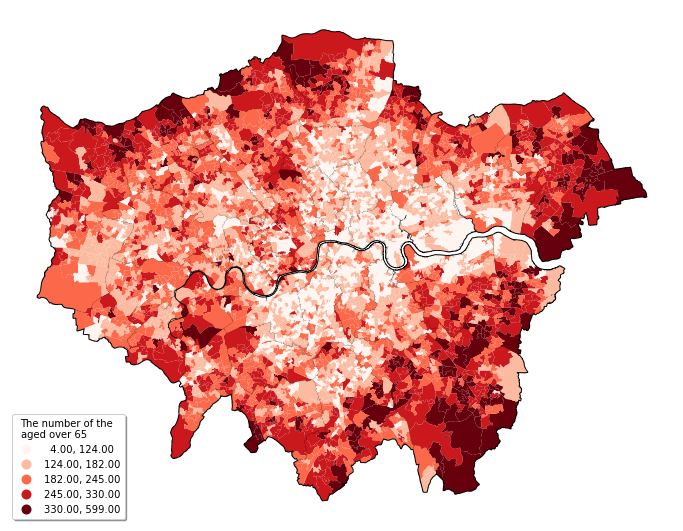

In [7]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,             
        facecolor='none',     
        edgecolor='Black',
        linewidth=2).axis('off')    
London_shp2.plot(ax=ax,             
        column=independent_variable[1],    
        scheme='naturalbreaks',    
        legend=True,  
        legend_kwds={"loc": "lower left",'title':'The number of the \naged over 65','shadow': True},       
        cmap='Reds',   
        edgecolor='none').axis('off')    
    
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/Aged_65+.png', dpi=400) 

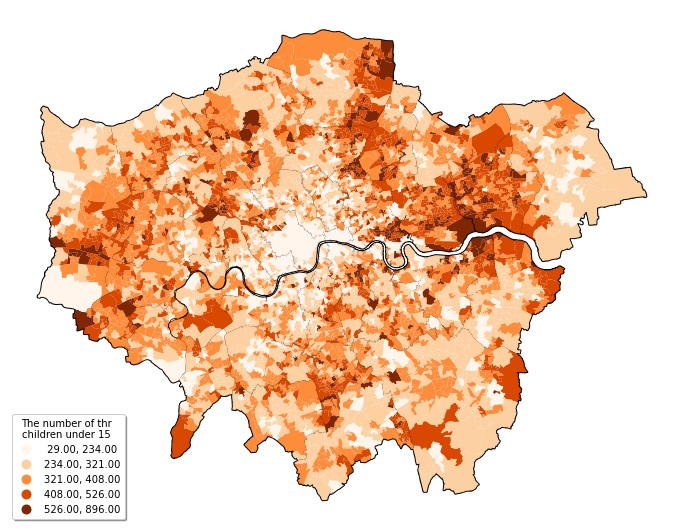

In [8]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,             
        facecolor='none',     
        edgecolor='Black',
        linewidth=2).axis('off')    
London_shp2.plot(ax=ax,             
        column=independent_variable[2],    
        scheme='naturalbreaks',    
        legend=True,  
        legend_kwds={"loc": "lower left",'title':'The number of thr \nchildren under 15','shadow': True},       
        cmap='Oranges',   
        edgecolor='none').axis('off')    
    
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/Children_15-.png', dpi=400) 

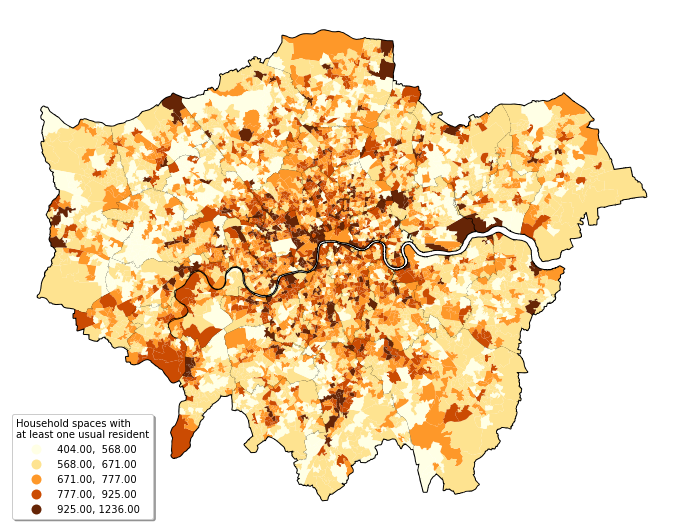

In [9]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,             
        facecolor='none',     
        edgecolor='Black',
        linewidth=2).axis('off')    
London_shp2.plot(ax=ax,             
        column=independent_variable[5],    
        scheme='naturalbreaks',    
        legend=True,  
        legend_kwds={"loc": "lower left",'title':'Household spaces with \nat least one usual resident','shadow': True},       
        cmap='YlOrBr',   
        edgecolor='none').axis('off')    
    
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/Household spaces.png', dpi=400) 

## The independent variables related to the urban road facilities and conditions

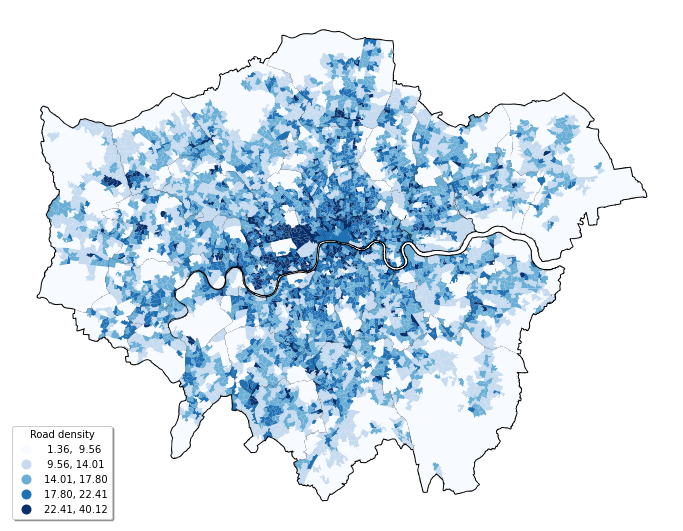

In [10]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,             
        facecolor='none',     
        edgecolor='Black',
        linewidth=2).axis('off')    
London_shp2.plot(ax=ax,             
        column=independent_variable[3],    
        scheme='naturalbreaks',    
        legend=True,  
        legend_kwds={"loc": "lower left",'title':'Road density','shadow': True},       
        cmap='Blues',   
        edgecolor='none').axis('off')    
    
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/Road_density.png', dpi=400) 

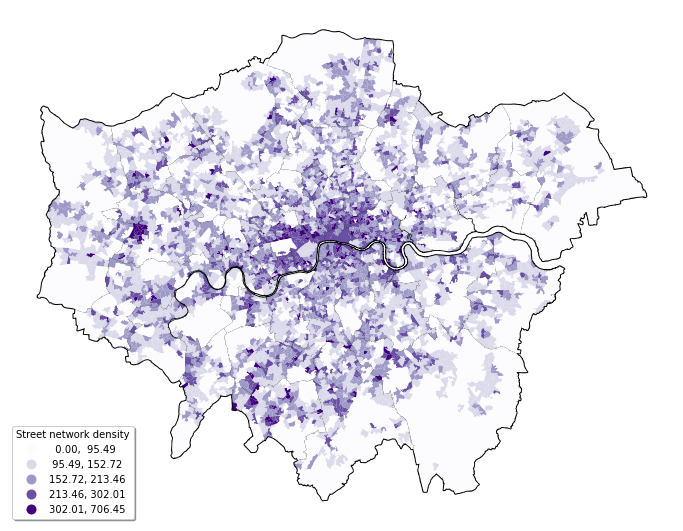

In [11]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,             
        facecolor='none',     
        edgecolor='Black',
        linewidth=2).axis('off')    
London_shp2.plot(ax=ax,             
        column=independent_variable[4],    
        scheme='naturalbreaks',    
        legend=True,  
        legend_kwds={"loc": "lower left",'title':'Street network density','shadow': True},       
        cmap='Purples',   
        edgecolor='none').axis('off')    
    
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/Street_network_density.png', dpi=400) 

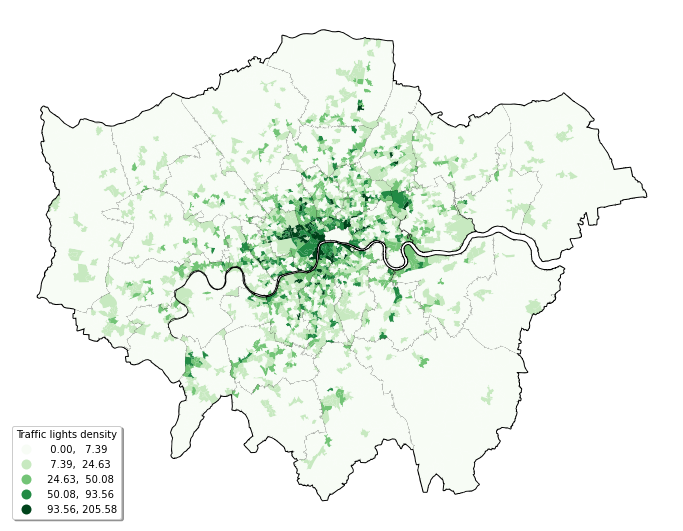

In [12]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,             
        facecolor='none',     
        edgecolor='Black',
        linewidth=2).axis('off')    
London_shp2.plot(ax=ax,             
        column=independent_variable[6],    
        scheme='naturalbreaks',    
        legend=True,  
        legend_kwds={"loc": "lower left",'title':'Traffic lights density','shadow': True},       
        cmap='Greens',   
        edgecolor='none').axis('off')    
    
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/Traffic_lights_density.png', dpi=400) 

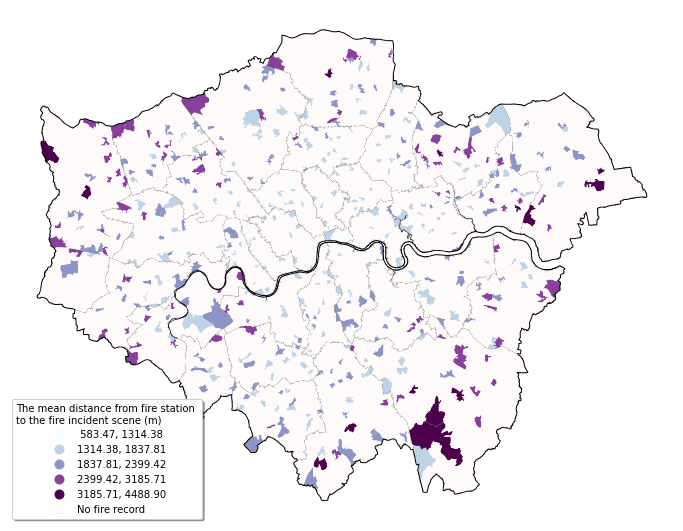

In [13]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),   
        facecolor='none',    
        edgecolor='Black',
        linewidth=2).axis('off')    
London_shp2.plot(ax=ax,            
        column=independent_variable[7],   
        scheme='naturalbreaks',   
        legend=True,  
        legend_kwds={"loc": "lower left",'title':'The mean distance from fire station \nto the fire incident scene (m)','shadow': True},  
        cmap='BuPu',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/Distance.png', dpi=400)  

## The independent variables related to the social-economic factors

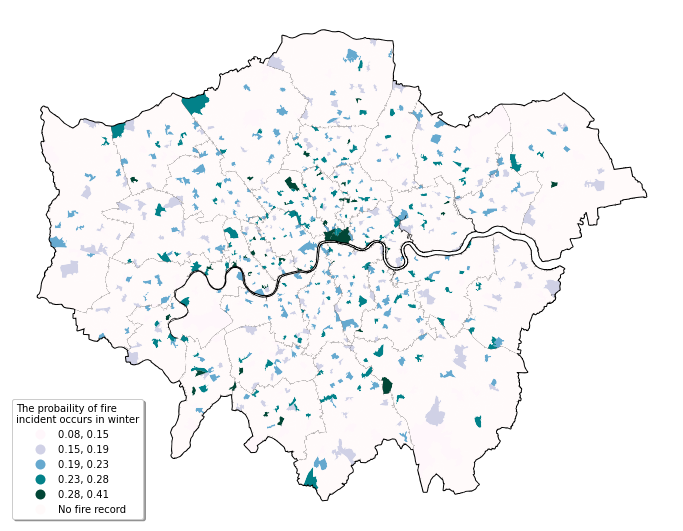

In [14]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),   
        facecolor='none',    
        edgecolor='Black',
        linewidth=2).axis('off')    
London_shp2.plot(ax=ax,            
        column=independent_variable[9],   
        scheme='naturalbreaks',   
        legend=True,  
        legend_kwds={"loc": "lower left",'title':'The probaility of fire \nincident occurs in winter','shadow': True},  
        cmap='PuBuGn',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/Winter.png', dpi=400)  

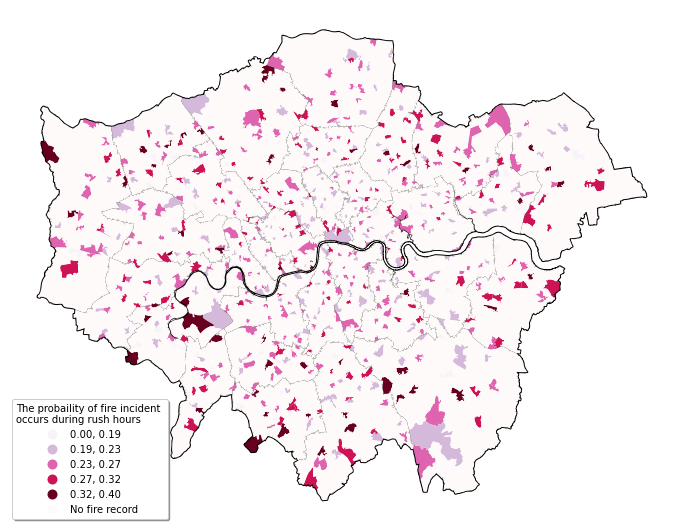

In [15]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),   
        facecolor='none',    
        edgecolor='Black',
        linewidth=2).axis('off')    
London_shp2.plot(ax=ax,            
        column=independent_variable[10],   
        scheme='naturalbreaks',   
        legend=True,  
        legend_kwds={"loc": "lower left",'title':'The probaility of fire incident \noccurs during rush hours','shadow': True},  
        cmap='PuRd',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/Commute.png', dpi=400)  

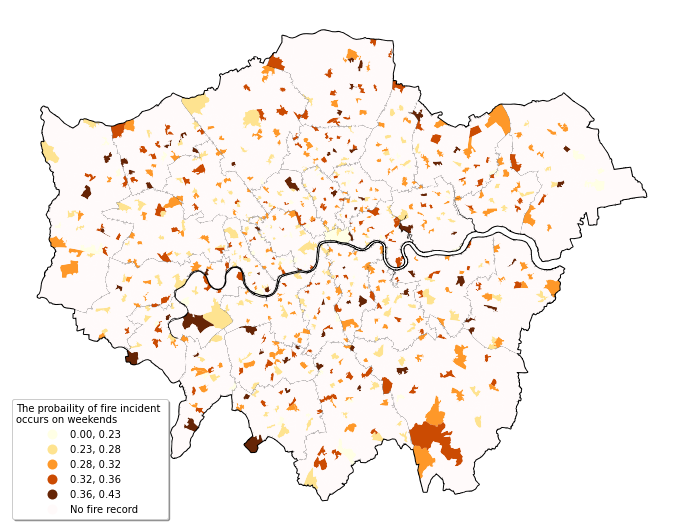

In [16]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),   
        facecolor='none',    
        edgecolor='Black',
        linewidth=2).axis('off')    
London_shp2.plot(ax=ax,            
        column=independent_variable[11],   
        scheme='naturalbreaks',   
        legend=True,  
        legend_kwds={"loc": "lower left",'title':'The probaility of fire incident \noccurs on weekends','shadow': True},  
        cmap='YlOrBr',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/Weekend.png', dpi=400) 

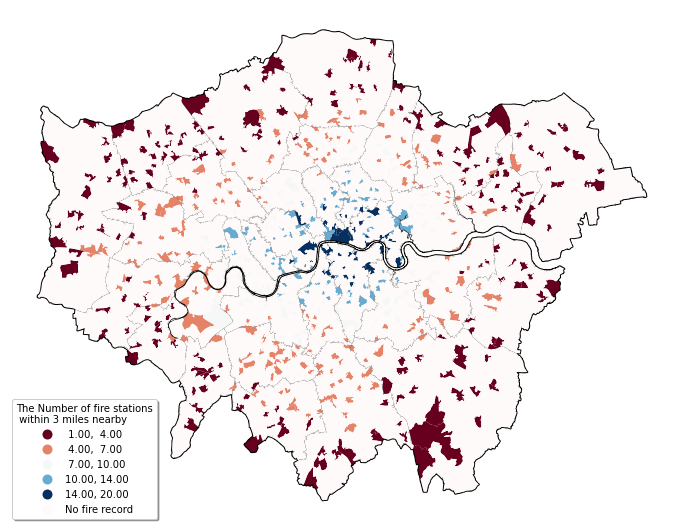

In [17]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),   
        facecolor='none',    
        edgecolor='Black',
        linewidth=2).axis('off')    
London_shp2.plot(ax=ax,            
        column=independent_variable[12],   
        scheme='naturalbreaks',   
        legend=True,  
        legend_kwds={"loc": "lower left",'title':'The Number of fire stations\n within 3 miles nearby','shadow': True},  
        cmap='RdBu',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/Fire_station_number.png', dpi=400) 

## The dependent variable - The fire incidents response time

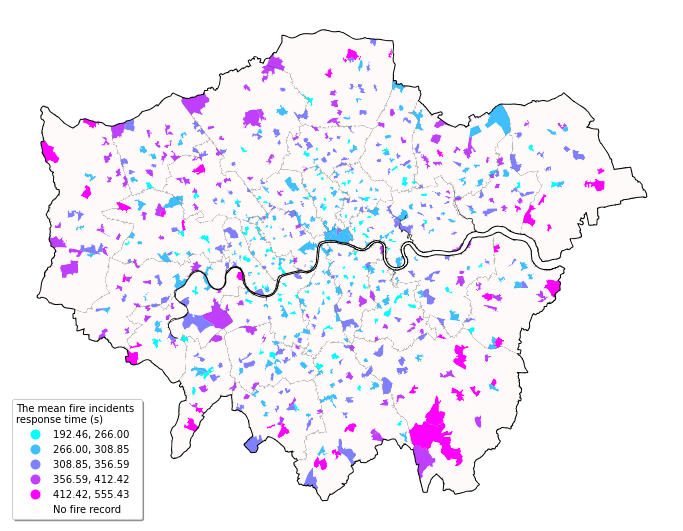

In [18]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),   
        facecolor='none',    
        edgecolor='Black',
        linewidth=2).axis('off')    
London_shp2.plot(ax=ax,            
        column=independent_variable[8],   
        scheme='naturalbreaks',   
        legend=True,  
        legend_kwds={"loc": "lower left",'title':'The mean fire incidents \nresponse time (s)','shadow': True},       
        cmap='cool',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/Fire_response_time.png', dpi=400)  

---
# Geographically weighted regression
---

In [19]:
data2=data.dropna()
London_shp3=pd.merge(London_shp,data2,on='LSOA_Code',how='left')
London_shp4=London_shp3.dropna()  


# Transfer the plane into dots and get the latitude and longitude
London_data = London_shp4.to_crs(from_epsg(27700)) 
u = London_data.centroid.x    
v = London_data.centroid.y   
London_coords = list(zip(u,v))

C:\Users\98001\anaconda3\lib\site-packages\pyproj\crs\crs.py:68: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [20]:
gwr_y = London_data['FirstPumpArriving_AttendanceTime'].values.reshape((-1,1))
gwr_X = London_data[['Index of Multiple Deprivation (IMD) Score','Age_65+','Children_15-','Road_density','Street_network_density',
                    'Household spaces with at least one usual resident','Traffic_light_density','Distance','Winter','Commute','Weekend',"Fire_Station_number"]].values

gwr_X = (gwr_X - gwr_X.mean(axis=0)) / gwr_X.std(axis=0)
gwr_y = gwr_y.reshape((-1,1))
gwr_y = (gwr_y - gwr_y.mean(axis=0)) / gwr_y.std(axis=0)

In [21]:
# Calculate the bandwidth
gwr_selector = Sel_BW(London_coords, gwr_y, gwr_X)
gwr_bw = gwr_selector.search(search_method='golden_section',criterion='AICc')
print('The best bandwidth：',gwr_bw)

The best bandwidth： 492.0


In [22]:
# GWR
gwr_results = GWR(London_coords, gwr_y, gwr_X, gwr_bw, fixed=False, kernel='bisquare', constant=True, spherical=True).fit() 
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                                 637
Number of covariates:                                                    13

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                             96.648
Log-likelihood:                                                    -303.270
AIC:                                                                632.540
AICc:                                                               635.215
BIC:                                                              -3932.376
R2:                                                                   0.848
Adj. R2:                                                              0.845

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [23]:
# GWR coefficients
independent_variable_gwr=['Intercept','c_Index of Multiple Deprivation (IMD) Score','c_Age_65+','c_Children_15-','c_Road_density','c_Street_network_density',
                    'c_Household spaces with at least one usual resident','c_Traffic_light_density','c_Distance','c_Winter','c_Commute','c_Weekend',"c_Fire_Station_number"]
gwr_coefficient=pd.DataFrame(gwr_results.params,columns=independent_variable_gwr)
gwr_coefficient.to_excel(r'C:\Users\98001\PY Fire record\GWR_Final\coefficient.xlsx')  
London_shp4.to_excel(r'C:\Users\98001\PY Fire record\GWR_Final\LSOA_code.xlsx')

In [24]:
# The significance or GWR coefficients
gwr_flter_t=pd.DataFrame(gwr_results.filter_tvals())

Please add the "LSOA_code.xlsx" to the "coefficent.xlsx" in excel.

In [25]:
gwr_coefficient_London= pd.read_excel(r'C:\Users\98001\PY Fire record\GWR_Final\coefficient.xlsx')
gwr_coefficient_London2=pd.merge(London_shp,gwr_coefficient_London,on='LSOA_Code',how='left')

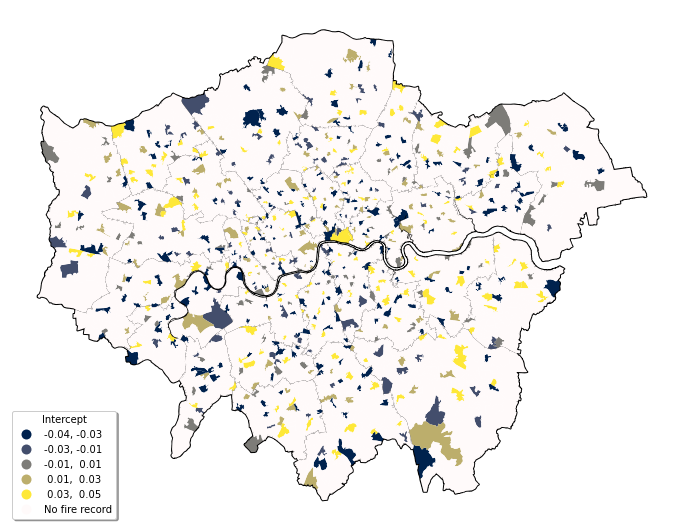

In [26]:
 fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),  
        facecolor='none',    
        #cmap='winter_r',   
        edgecolor='Black',
        linewidth=2).axis('off')    
gwr_coefficient_London2.plot(ax=ax,          
        column=independent_variable_gwr[0],    
        scheme='naturalbreaks',   
        legend=True,
        legend_kwds={"loc": "lower left",'title':'Intercept','shadow': True},       
        cmap='cividis',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/GWR - Intercept.png', dpi=400)  

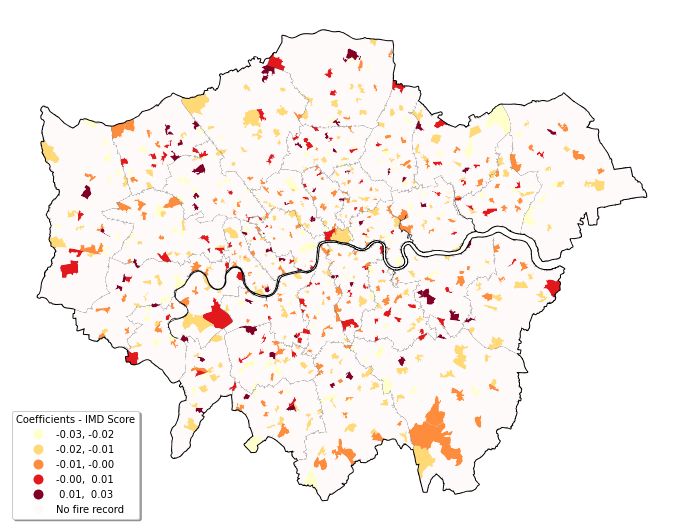

In [27]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),  
        facecolor='none',    
        #cmap='winter_r',   
        edgecolor='Black',
        linewidth=2).axis('off')    
gwr_coefficient_London2.plot(ax=ax,          
        column=independent_variable_gwr[1],    
        scheme='naturalbreaks',   
        legend=True,
        legend_kwds={"loc": "lower left",'title':'Coefficients - IMD Score','shadow': True},       
        cmap='YlOrRd',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/GWR - IMD Score.png', dpi=400)  

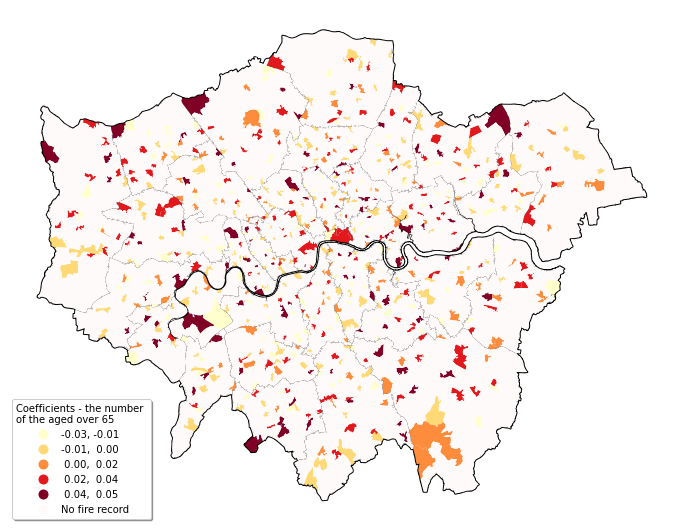

In [28]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),  
        facecolor='none',    
        #cmap='winter_r',   
        edgecolor='Black',
        linewidth=2).axis('off')    
gwr_coefficient_London2.plot(ax=ax,          
        column=independent_variable_gwr[2],    
        scheme='naturalbreaks',   
        legend=True,
        legend_kwds={"loc": "lower left",'title':'Coefficients - the number \nof the aged over 65','shadow': True},       
        cmap='YlOrRd',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/GWR - The aged_65+.png', dpi=400)   

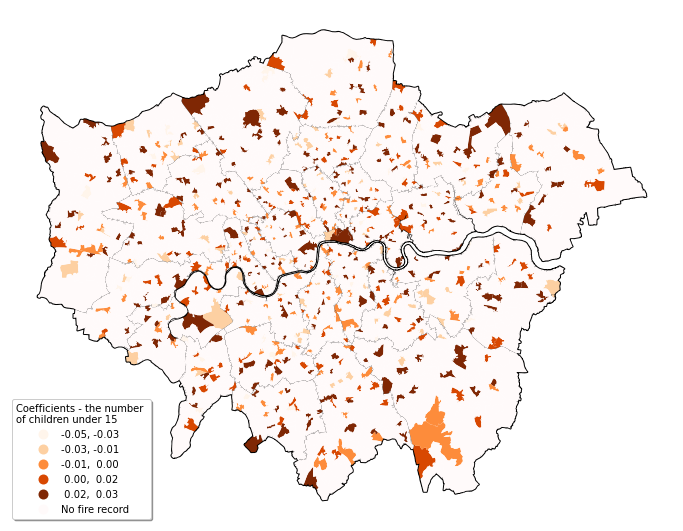

In [29]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),  
        facecolor='none',    
        #cmap='winter_r',   
        edgecolor='Black',
        linewidth=2).axis('off')    
gwr_coefficient_London2.plot(ax=ax,          
        column=independent_variable_gwr[3],    
        scheme='naturalbreaks',   
        legend=True,
        legend_kwds={"loc": "lower left",'title':'Coefficients - the number \nof children under 15','shadow': True},       
        cmap='Oranges',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/GWR - chilren15-.png', dpi=400)   

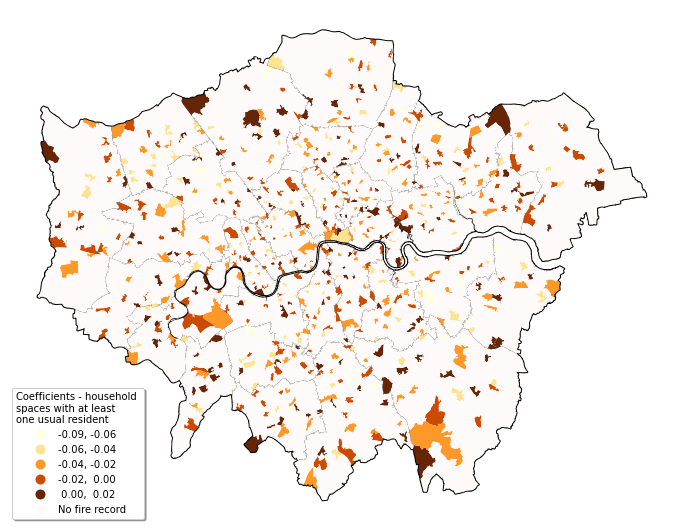

In [30]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),  
        facecolor='none',    
        #cmap='winter_r',   
        edgecolor='Black',
        linewidth=2).axis('off')    
gwr_coefficient_London2.plot(ax=ax,          
        column=independent_variable_gwr[6],    
        scheme='naturalbreaks',   
        legend=True,
        legend_kwds={"loc": "lower left",'title':'Coefficients - household \nspaces with at least \none usual resident','shadow': True},       
        cmap='YlOrBr',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/GWR - Household spaces.png', dpi=400)   

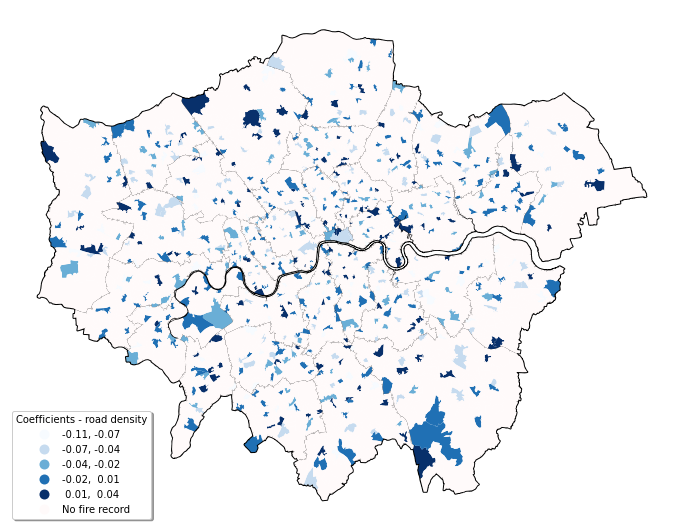

In [31]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),  
        facecolor='none',    
        #cmap='winter_r',   
        edgecolor='Black',
        linewidth=2).axis('off')    
gwr_coefficient_London2.plot(ax=ax,          
        column=independent_variable_gwr[4],    
        scheme='naturalbreaks',   
        legend=True,
        legend_kwds={"loc": "lower left",'title':'Coefficients - road density','shadow': True},       
        cmap='Blues',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/GWR - road density.png', dpi=400)  

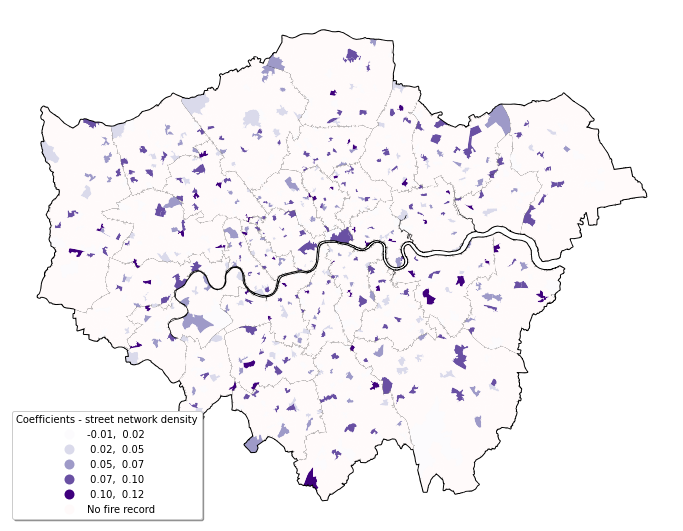

In [32]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),  
        facecolor='none',    
        #cmap='winter_r',   
        edgecolor='Black',
        linewidth=2).axis('off')    
gwr_coefficient_London2.plot(ax=ax,          
        column=independent_variable_gwr[5],    
        scheme='naturalbreaks',   
        legend=True,
        legend_kwds={"loc": "lower left",'title':'Coefficients - street network density','shadow': True},       
        cmap='Purples',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/GWR - street network density.png', dpi=400)  

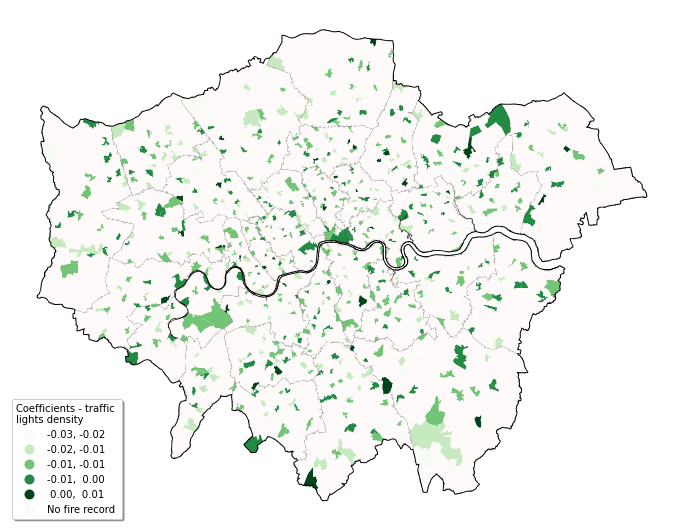

In [33]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),  
        facecolor='none',    
        #cmap='winter_r',   
        edgecolor='Black',
        linewidth=2).axis('off')    
gwr_coefficient_London2.plot(ax=ax,          
        column=independent_variable_gwr[7],    
        scheme='naturalbreaks',   
        legend=True,
        legend_kwds={"loc": "lower left",'title':'Coefficients - traffic \nlights density','shadow': True},       
        cmap='Greens',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/GWR - traffic lights density.png', dpi=400)

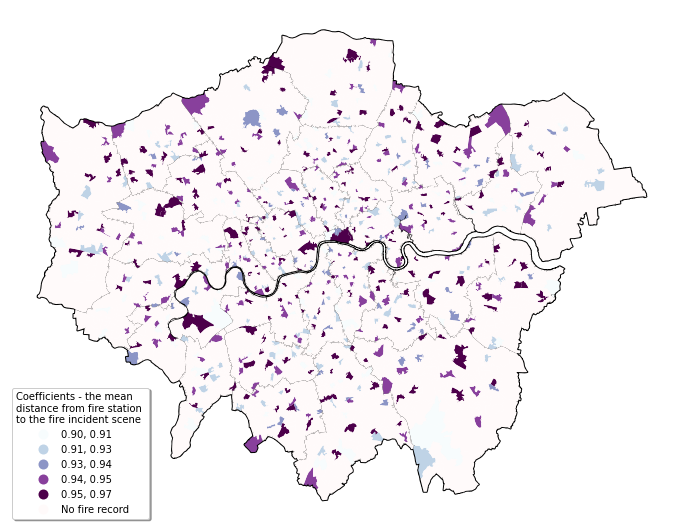

In [27]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),  
        facecolor='none',    
        #cmap='winter_r',   
        edgecolor='Black',
        linewidth=2).axis('off')    
gwr_coefficient_London2.plot(ax=ax,          
        column=independent_variable_gwr[8],    
        scheme='naturalbreaks',   
        legend=True,
        legend_kwds={"loc": "lower left",'title':'Coefficients - the mean \ndistance from fire station \nto the fire incident scene','shadow': True},       
        cmap='BuPu',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/GWR - distance.png', dpi=400)

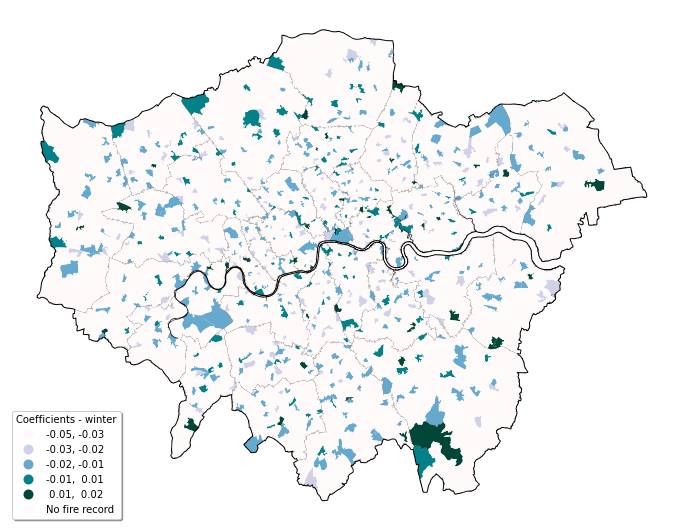

In [34]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),  
        facecolor='none',    
        #cmap='winter_r',   
        edgecolor='Black',
        linewidth=2).axis('off')    
gwr_coefficient_London2.plot(ax=ax,          
        column=independent_variable_gwr[9],    
        scheme='naturalbreaks',   
        legend=True,
        legend_kwds={"loc": "lower left",'title':'Coefficients - winter','shadow': True},       
        cmap='PuBuGn',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/GWR - Winter.png', dpi=400)

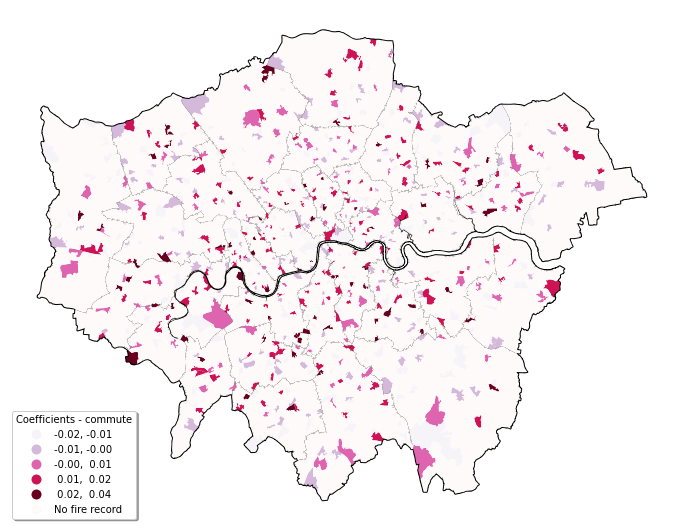

In [30]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),  
        facecolor='none',    
        #cmap='winter_r',   
        edgecolor='Black',
        linewidth=2).axis('off')    
gwr_coefficient_London2.plot(ax=ax,          
        column=independent_variable_gwr[10],    
        scheme='naturalbreaks',   
        legend=True,
        legend_kwds={"loc": "lower left",'title':'Coefficients - commute','shadow': True},       
        cmap='PuRd',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/GWR - Commute.png', dpi=400)

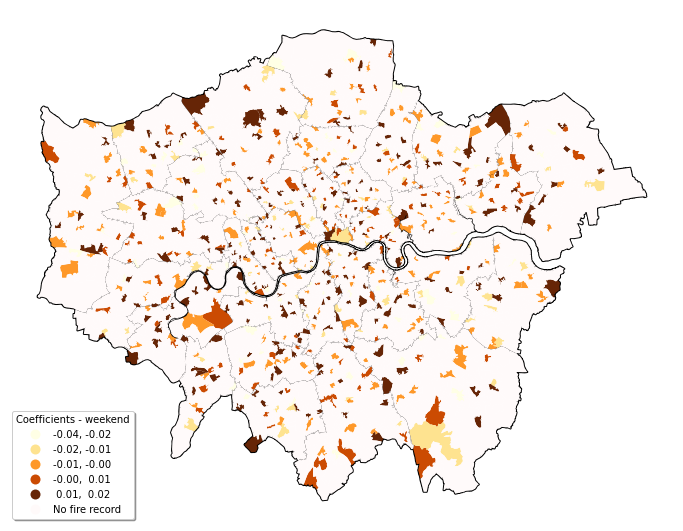

In [35]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),  
        facecolor='none',    
        #cmap='winter_r',   
        edgecolor='Black',
        linewidth=2).axis('off')    
gwr_coefficient_London2.plot(ax=ax,          
        column=independent_variable_gwr[11],    
        scheme='naturalbreaks',   
        legend=True,
        legend_kwds={"loc": "lower left",'title':'Coefficients - weekend','shadow': True},       
        cmap='YlOrBr',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/GWR - Weekend.png', dpi=400)

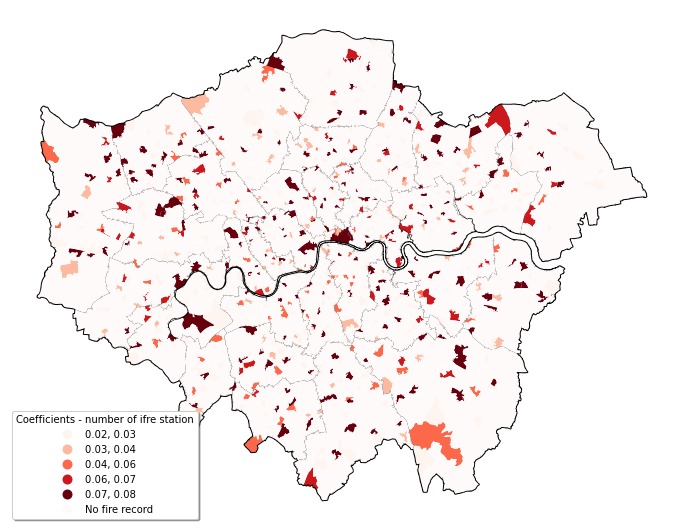

In [38]:
fig, ax = plt.subplots(figsize=(12, 12)) 
London_bdy.plot(ax=ax,figsize=(20, 20),  
        facecolor='none',    
        #cmap='winter_r',   
        edgecolor='Black',
        linewidth=2).axis('off')    
gwr_coefficient_London2.plot(ax=ax,          
        column=independent_variable_gwr[12],    
        scheme='naturalbreaks',   
        legend=True,
        legend_kwds={"loc": "lower left",'title':'Coefficients - number of ifre station','shadow': True},       
        cmap='Reds',   
        missing_kwds={"color": "snow","edgecolor": "none","label": "No fire record"},   
        edgecolor='none').axis('off')    
  
fig.savefig('C:/Users/98001/PY Fire record/GWR_Final/Distrbution map/GWR -number of ifre station.png', dpi=400)